<a href="https://colab.research.google.com/github/maxyakovlevclone/mmdetection/blob/master/mmdetection_pets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Welcome to the MMDetection: Cats and Dogs Breed Identification


![alt text](https://drive.google.com/uc?id=1L8vPVDwmpeDDR8t_uUaXGCHKt2Zl9jBs)

### Loading and unzipping data from my personal DropBox profile.
Data used is a cleaned and sorted version of Oxford IIT Pet Dataset one can find at: https://www.robots.ox.ac.uk/~vgg/data/pets/. 

In [1]:
!wget -O data.zip https://www.dropbox.com/s/p4nn5rpv2304euh/data.zip?dl=0

--2020-03-13 19:47:39--  https://www.dropbox.com/s/p4nn5rpv2304euh/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.1, 2620:100:601f:1::a27d:901
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/p4nn5rpv2304euh/data.zip [following]
--2020-03-13 19:47:39--  https://www.dropbox.com/s/raw/p4nn5rpv2304euh/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc34c464675dc9d2530ce2ad6e57.dl.dropboxusercontent.com/cd/0/inline/Az2YtzSM_8lE-iXAVJ9iJk_CmbFmTAJ1Fs6RW7bU-TTgkgoXNCT3t86GpNKy3Wass6XNKAdE-SjBhxIOCGCXjFYgFzLuewiRdeEJUahoNA4VqqQEnBucaVkZlGUisBUFVl0/file# [following]
--2020-03-13 19:47:39--  https://uc34c464675dc9d2530ce2ad6e57.dl.dropboxusercontent.com/cd/0/inline/Az2YtzSM_8lE-iXAVJ9iJk_CmbFmTAJ1Fs6RW7bU-TTgkgoXNCT3t86GpNKy3Wass6XNKAdE-SjBhxIOCGCXjFYgFzLuewiRdeEJUahoNA4VqqQEnBucaVkZl

In [0]:
!unzip /content/data.zip

###Deciding on the models to use
More models can be found in GitHub Repo under Configs. Please note: the data doesn't have mask annotations, so some models are unapplicable.



In [0]:
MODELS_CONFIG = {
    'faster_rcnn_r50_fpn_1x': {
        'config_file': 'configs/faster_rcnn_r50_fpn_1x.py'
    },
    'cascade_rcnn_r50_fpn_1x': {
        'config_file': 'configs/cascade_rcnn_r50_fpn_1x.py',
    },
    'retinanet_r50_fpn_1x': {
        'config_file': 'configs/retinanet_r50_fpn_1x.py',
    }
}

###Cloning the GitHub Repo

In [4]:
!git clone https://github.com/maxyakovlevclone/mmdetection

Cloning into 'mmdetection'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 7031 (delta 13), reused 23 (delta 10), pack-reused 7003
Receiving objects: 100% (7031/7031), 5.57 MiB | 32.02 MiB/s, done.
Resolving deltas: 100% (4837/4837), done.


###Deciding on the model to train and the number of training epochs
Note: If need to test the execution train for 1 epoch.

In [0]:
selected_model = 'faster_rcnn_r50_fpn_1x'  
total_epochs = 25

config_file = MODELS_CONFIG[selected_model]['config_file']

###Making all the necessary installations and config adjustments

In [6]:
!pip install mmcv

     |████████████████████████████████| 51kB 1.8MB/s 
  Created wheel for mmcv: filename=mmcv-0.3.2-cp36-cp36m-linux_x86_64.whl size=167421 sha256=2aa4b6de36d9b59c4aa97bccfe0f33f1aa44ff88b0514dff129951a47f6afba2
  Stored in directory: /root/.cache/pip/wheels/7f/01/1e/912364a0bcd8dc5af9d27c939c70a0cf5d223adefff21d83d4
Successfully built mmcv


In [7]:
!pip install terminaltables

  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp36-none-any.whl size=15356 sha256=12719675ed727b329f8833c6077c7926a66a65190d6d8a10c62856da9fd035a2
  Stored in directory: /root/.cache/pip/wheels/30/6b/50/6c75775b681fb36cdfac7f19799888ef9d8813aff9e379663e
Successfully built terminaltables


In [0]:
import os
from os.path import exists, join, basename, splitext
import sys
import time
import matplotlib
import matplotlib.pylab as plt
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
import re



project_name = "/content/"
config_fname = os.path.join(project_name, 'mmdetection', config_file)

assert os.path.isfile(config_fname), '`{}` not exist'.format(config_fname)
config_fname

anno_path = os.path.join(project_name, "data/VOC2007/Annotations")
init_file = os.path.join("/content/mmdetection", "mmdet/datasets/my_dataset.py")


In [9]:
classes_names = []
xml_list = []
for xml_file in glob.glob(anno_path + "/*.xml"):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall("object"):
        classes_names.append(member[0].text)
classes_names = list(set(classes_names))
classes_names.sort()
classes_names

['abyssinian',
 'american_bulldog',
 'american_pit_bull_terrier',
 'basset',
 'beagle',
 'bengal',
 'birman',
 'bombay',
 'boxer',
 'british_shorthair',
 'chihuahua',
 'egyptian',
 'english_cocker',
 'english_setter',
 'german_shorthaired',
 'great_pyrenees',
 'havanese',
 'japanese_chin',
 'keeshond',
 'leonberger',
 'maine_coon',
 'miniature_pinscher',
 'newfoundland',
 'persian',
 'pomeranian',
 'pug',
 'ragdoll',
 'russian_blue',
 'saint_bernard',
 'samoyed',
 'scottish_terrier',
 'shiba_inu',
 'siamese',
 'sphynx',
 'staffordshire',
 'wheaten_terrier',
 'yorkshire_terrier']

In [10]:
fname = init_file
with open(fname) as f:
    s = f.read()
    s = re.sub('CLASSES = \(.*?\)',
               'CLASSES = ({})'.format(", ".join(["\'{}\'".format(name) for name in classes_names])), s, flags=re.S)
with open(fname, 'w') as f:
    f.write(s)
!cat {init_file}

from .coco import CocoDataset
from .registry import DATASETS
from .xml_style import XMLDataset
from .voc import VOCDataset
@DATASETS.register_module
class MyDataset(XMLDataset):

    #CLASSES =('Dent', 'Scratch_or_spot')#, 'Shatter', 'Tear')
    CLASSES = ('abyssinian', 'american_bulldog', 'american_pit_bull_terrier', 'basset', 'beagle', 'bengal', 'birman', 'bombay', 'boxer', 'british_shorthair', 'chihuahua', 'egyptian', 'english_cocker', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'maine_coon', 'miniature_pinscher', 'newfoundland', 'persian', 'pomeranian', 'pug', 'ragdoll', 'russian_blue', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'siamese', 'sphynx', 'staffordshire', 'wheaten_terrier', 'yorkshire_terrier')

Here we initialize our dataset and re-write some of the paths


In [11]:
fname = config_fname
with open(fname) as f:
    s = f.read()
    work_dir = re.findall(r"work_dir = \'(.*?)\'", s)[0]
    # Update `num_classes` including `background` class.
    s = re.sub('num_classes=.*?,',
               'num_classes={},'.format(len(classes_names)+1), s)
    s = re.sub('ann_file=.*?\],',
               "ann_file=data_root + 'VOC2007/ImageSets/Main/trainval.txt',", s, flags=re.S)
    s = re.sub('total_epochs = \d+',
               'total_epochs = {} #'.format(total_epochs), s)
    if "CocoDataset" in s:
        s = re.sub("dataset_type = 'CocoDataset'",
                   "dataset_type = 'MyDataset'", s)
        s = re.sub("data_root = 'data/coco/'",
                   "data_root = '/content/data/'", s)
        s = re.sub("annotations/instances_train2017.json",
                   "VOC2007/ImageSets/Main/trainval.txt", s)
        s = re.sub("annotations/instances_val2017.json",
                   "VOC2007/ImageSets/Main/test.txt", s)
        s = re.sub("annotations/instances_val2017.json",
                   "VOC2007/ImageSets/Main/test.txt", s)
        s = re.sub("train2017", "VOC2007", s)
        s = re.sub("val2017", "VOC2007", s)
    else:
        s = re.sub('img_prefix=.*?\],',
                   "img_prefix=data_root + 'VOC2007/',".format(total_epochs), s)
with open(fname, 'w') as f:
    f.write(s)
!cat {config_fname}

# model settings
model = dict(
    type='FasterRCNN',
    pretrained='torchvision://resnet50',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        style='pytorch'),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_scales=[8],
        anchor_ratios=[0.5, 1.0, 2.0],
        anchor_strides=[4, 8, 16, 32, 64],
        target_means=[.0, .0, .0, .0],
        target_stds=[1.0, 1.0, 1.0, 1.0],
        loss_cls=dict(
            type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0),
        loss_bbox=dict(type='SmoothL1Loss', beta=1.0 / 9.0, loss_weight=1.0)),
    bbox_roi_extractor=dict(
        type='SingleRoIExtractor',
        roi_layer=dict(type='RoIAl

###Installing MMdetection 

In [0]:
%cd mmdetection
!python setup.py develop

###Training: Nvidia Tesla T4 GPU
From my experience, training accuracy converges after 25-30 epochs with this dataset

In [0]:
!python -W ignore::UserWarning  tools/train.py /content/mmdetection/configs/faster_rcnn_r50_fpn_1x.py 

###Testing
Starting with getting precision/recall table:

In [14]:
!python tools/test.py /content/mmdetection/configs/faster_rcnn_r50_fpn_1x.py /content/mmdetection/work_dirs/faster_rcnn_r50_fpn_1x/latest.pth --eval mAP

[>>] 931/931, 12.2 task/s, elapsed: 76s, ETA:     0s
+---------------------------+-----+------+--------+-------+
| class                     | gts | dets | recall | ap    |
+---------------------------+-----+------+--------+-------+
| abyssinian                | 24  | 88   | 1.000  | 0.757 |
| american_bulldog          | 27  | 103  | 0.889  | 0.764 |
| american_pit_bull_terrier | 23  | 107  | 0.957  | 0.797 |
| basset                    | 23  | 121  | 0.957  | 0.854 |
| beagle                    | 35  | 127  | 0.971  | 0.889 |
| bengal                    | 23  | 84   | 0.913  | 0.638 |
| birman                    | 34  | 67   | 1.000  | 0.938 |
| bombay                    | 25  | 47   | 1.000  | 0.994 |
| boxer                     | 26  | 114  | 0.923  | 0.781 |
| british_shorthair         | 25  | 58   | 1.000  | 0.998 |
| chihuahua                 | 28  | 84   | 0.929  | 0.896 |
| egyptian                  | 30  | 74   | 1.000  | 0.876 |
| english_cocker            | 25  | 101  | 1.00

Now, let's get derive training loss curve graphs:

**Note**: please first copy a path to the json file by hand from /content/mmdetection/work_dirs/...

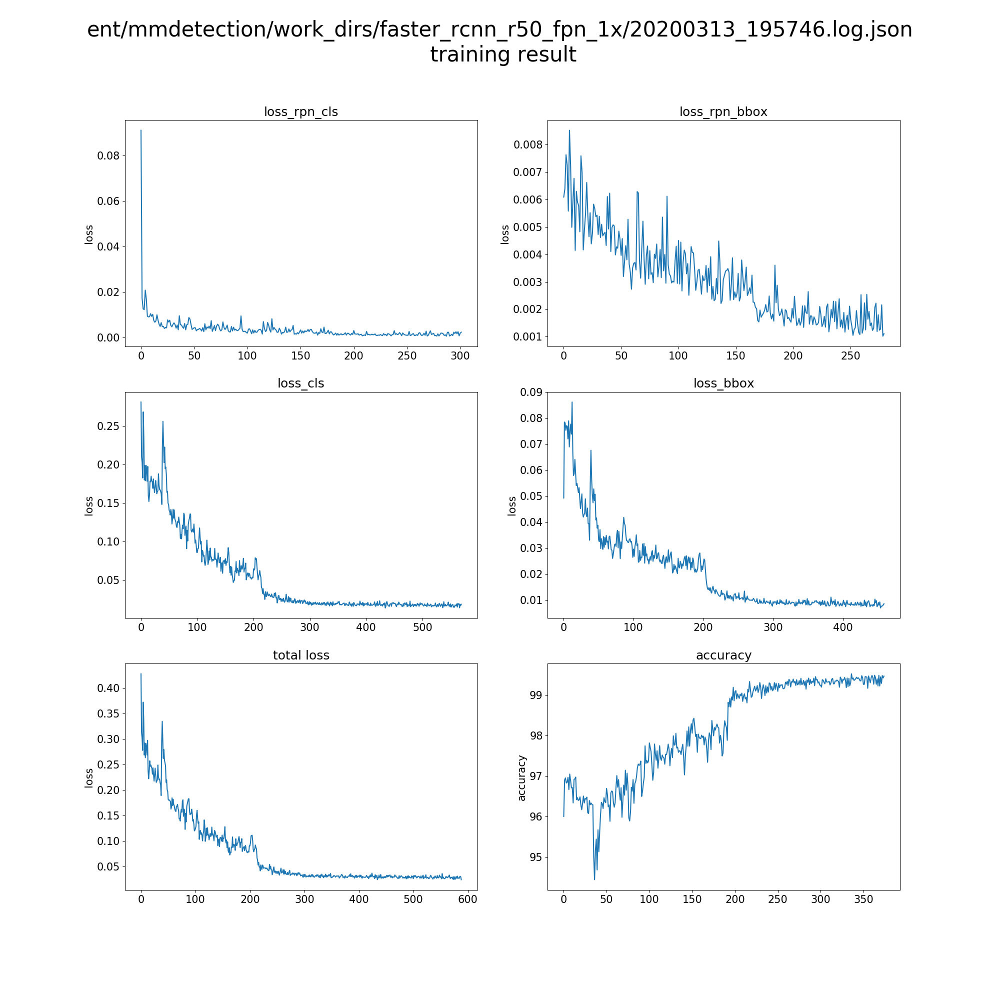

In [19]:
!python visualize.py /content/mmdetection/work_dirs/faster_rcnn_r50_fpn_1x/20200313_195746.log.json
from IPython.display import Image
Image('/content/mmdetection/work_dirs/_result.png')


Now, we will get AUC and F-measure graphs for the first 5 classes only. We're doing so because the graph becomes illegible as I added all the classes at once.
Note: there are 37 classes in the data.

In [15]:
!python tools/test.py /content/mmdetection/configs/faster_rcnn_r50_fpn_1x.py /content/mmdetection/work_dirs/faster_rcnn_r50_fpn_1x/latest.pth --out work_dirs/result.pkl

[>>] 931/931, 12.2 task/s, elapsed: 76s, ETA:     0s
writing results to work_dirs/result.pkl


/content/mmdetection/mmdet/core/evaluation/mean_ap_visualize.py:379: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(211)
/content/mmdetection/mmdet/core/evaluation/mean_ap_visualize.py:388: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(212)
/content/mmdetection/mmdet/core/evaluation/mean_ap_visualize.py:379: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently 

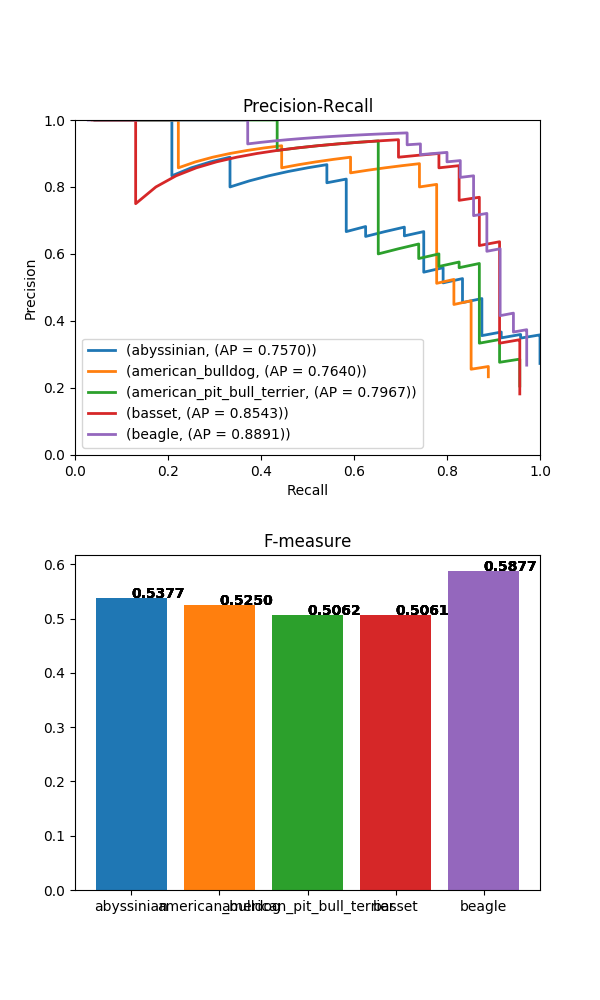

In [17]:
#Demonstrations for 5 classes

!python tools/voc_eval_visualize.py /content/mmdetection/work_dirs/result.pkl /content/mmdetection/configs/faster_rcnn_r50_fpn_1x.py
from IPython.display import Image
Image('/content/mmdetection/work_dirs/_curves.png')

###Visualizing the performance for some images

In [20]:
%cd /content/mmdetection

/content/mmdetection


In [0]:
test = open("/content/data/VOC2007/ImageSets/Main/test.txt","r").read().split()

In [0]:
from mmdet.apis import init_detector, inference_detector, show_result,show_result_pyplot
import mmcv

config_file = '/content/mmdetection/configs/faster_rcnn_r50_fpn_1x.py'
checkpoint_file = '/content/mmdetection/work_dirs/faster_rcnn_r50_fpn_1x/latest.pth'

# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cuda:0')


In [0]:
print(test)

Let's see the predicted breed and the likelihood for some pictures:

0 american_pit_bull_terrier_163
1 Birman_163
2 japanese_chin_190
3 great_pyrenees_125
4 basset_hound_143
5 British_Shorthair_122
6 chihuahua_142
7 Russian_Blue_156
8 Russian_Blue_193
9 havanese_122
10 Maine_Coon_102
11 english_setter_174
12 Maine_Coon_138
13 chihuahua_147
14 chihuahua_12
15 american_pit_bull_terrier_121
16 Siamese_173
17 boxer_131
18 american_bulldog_196
19 Birman_169
20 Persian_217


/content/mmdetection/mmdet/apis/inference.py:203: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=fig_size)


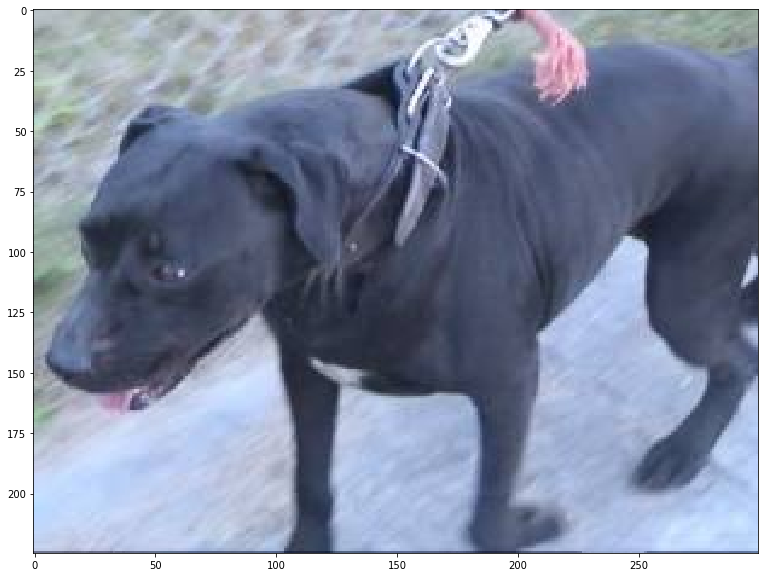

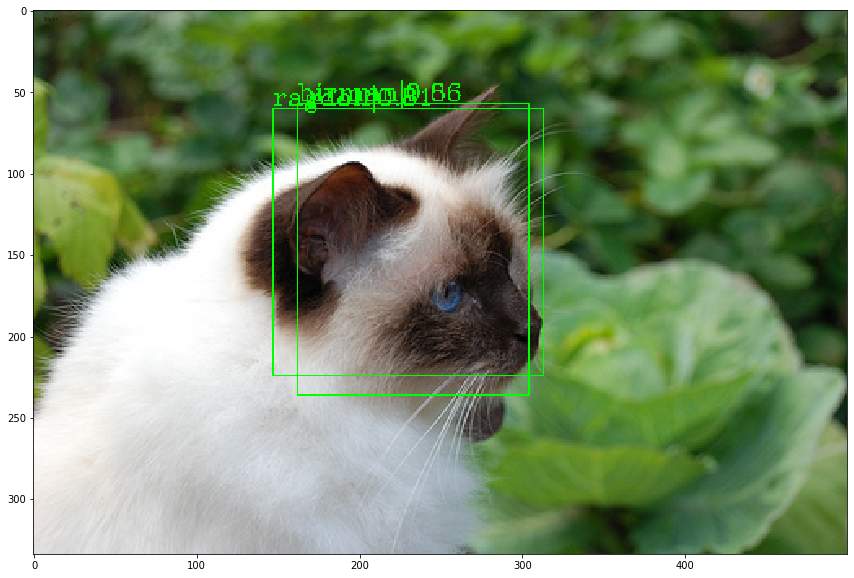

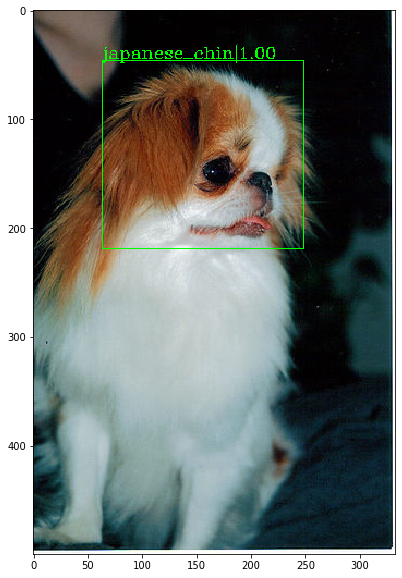

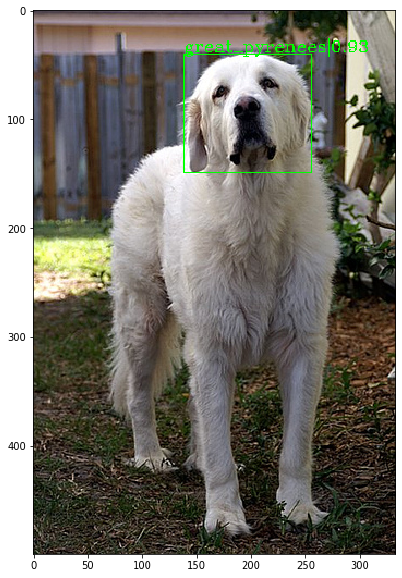

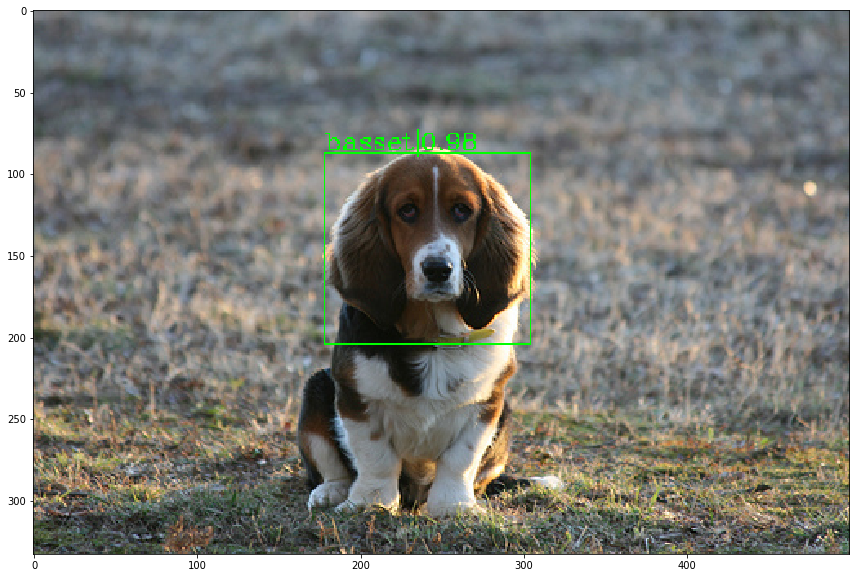

...

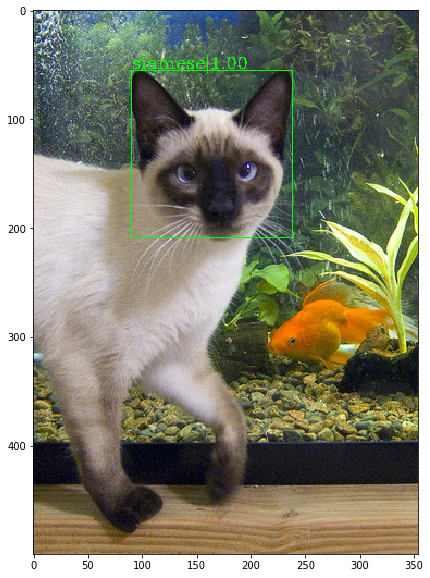

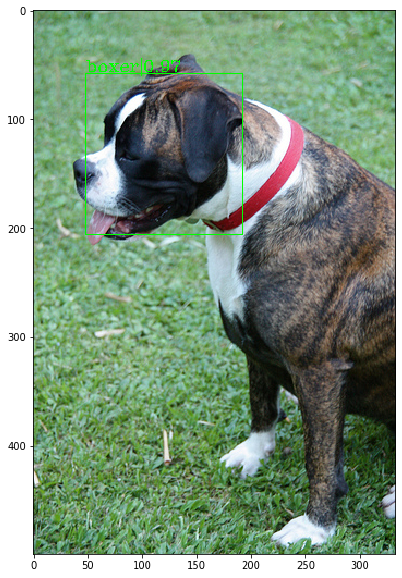

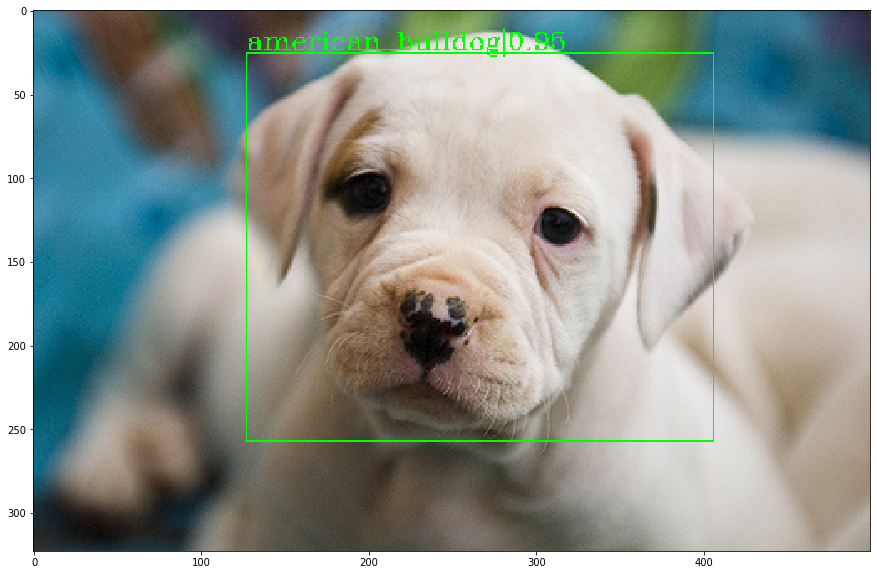

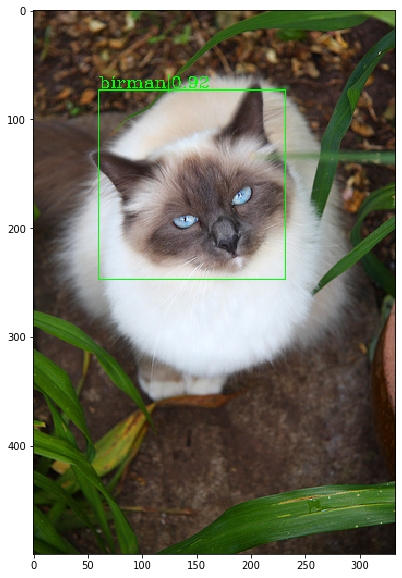

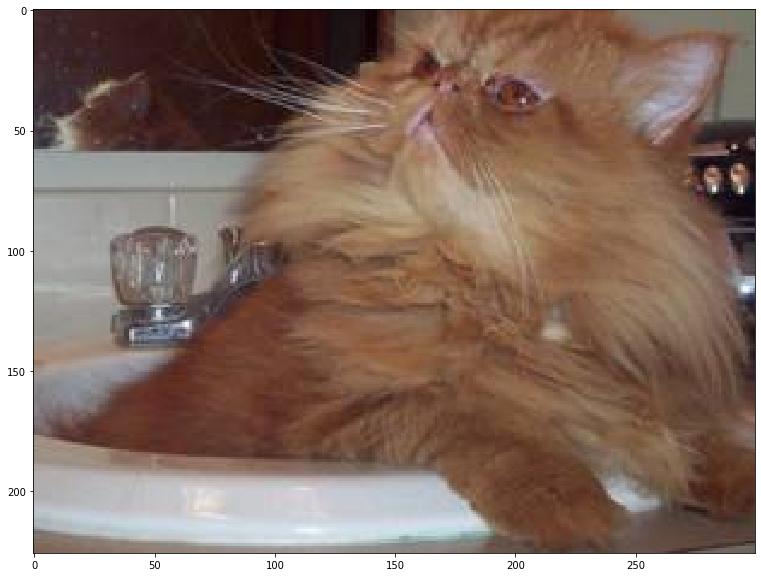

In [25]:
# test some images and show the results
path = "/content/data/VOC2007/JPEGImages/{}.jpg"
for index,img in enumerate(test):
  print(index, img)
  result = inference_detector(model, path.format(img))
  show_result_pyplot(path.format(img), result, ['abyssinian',
 'american_bulldog',
 'american_pit_bull_terrier',
 'basset',
 'beagle',
 'bengal',
 'birman',
 'bombay',
 'boxer',
 'british_shorthair',
 'chihuahua',
 'egyptian',
 'english_cocker',
 'english_setter',
 'german_shorthaired',
 'great_pyrenees',
 'havanese',
 'japanese_chin',
 'keeshond',
 'leonberger',
 'maine_coon',
 'miniature_pinscher',
 'newfoundland',
 'persian',
 'pomeranian',
 'pug',
 'ragdoll',
 'russian_blue',
 'saint_bernard',
 'samoyed',
 'scottish_terrier',
 'shiba_inu',
 'siamese',
 'sphynx',
 'staffordshire',
 'wheaten_terrier',
 'yorkshire_terrier'],score_thr=0.7)
  if index == 20:

      break